In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
iran = pd.read_csv('dataset/FAO_STAT_iran_crops_livestock_products.csv')

In [4]:
iran = iran.drop(['Domain Code' , 'Domain' , 'Area Code' , 'Area' , 'Element Code' , 'Item Code' , 'Year Code'
               , 'Flag' , 'Flag Description'] , axis = 1)

In [5]:
iran_export_quantity = iran[iran['Element'] == 'Export Quantity']
iran_export_value = iran[iran['Element'] == 'Export Value']
iran_import_quantity = iran[iran['Element'] == 'Import Value']
iran_import_value = iran[iran['Element'] == 'Import Quantity']

In [6]:
iran_export_value_counts_item = iran_export_value['Item'].value_counts().to_frame()

In [7]:
iran_export_value_counts_item.reset_index(inplace=True)

In [8]:
iran_export_value_counts_item = iran_export_value_counts_item[iran_export_value_counts_item['Item'] >= 10]

In [25]:
list_of_items = iran_export_value_counts_item['index']

In [9]:
for row, col in iran_export_value.iterrows():
    if col['Item'] not in list(iran_export_value_counts_item['index']):
        iran_export_value.drop(row, axis= 0, inplace= True)
iran_export_value.reset_index(inplace=True)

/home/mars/.local/lib/python2.7/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [10]:
del iran_export_value['index']

In [11]:
iran_export_value = iran_export_value.dropna()

In [12]:
iran_export_value.reset_index(inplace=True)

In [13]:
del iran_export_value['index']

In [14]:
almonds_shelled = iran_export_value[iran_export_value['Item'] == 'Almonds shelled'] 

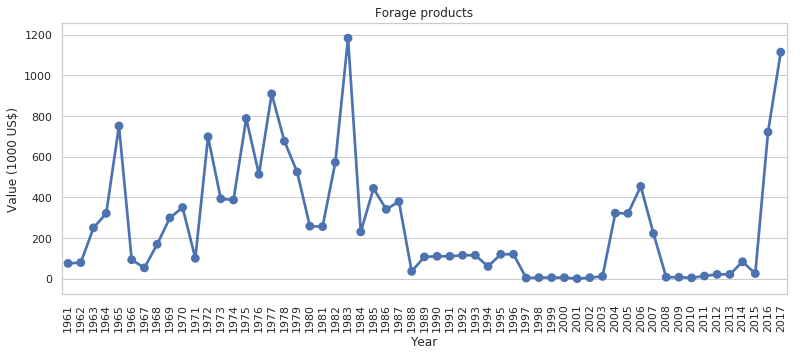

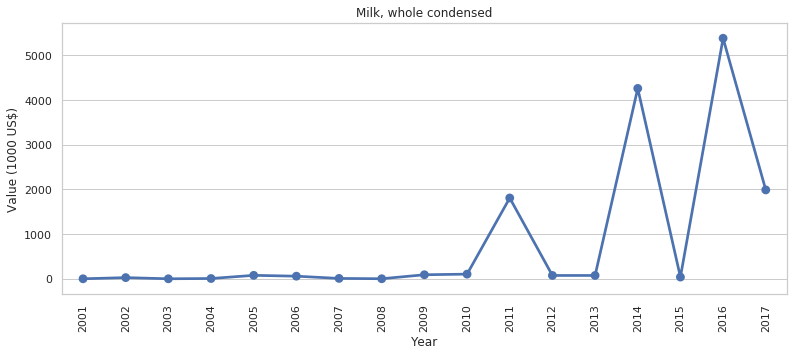

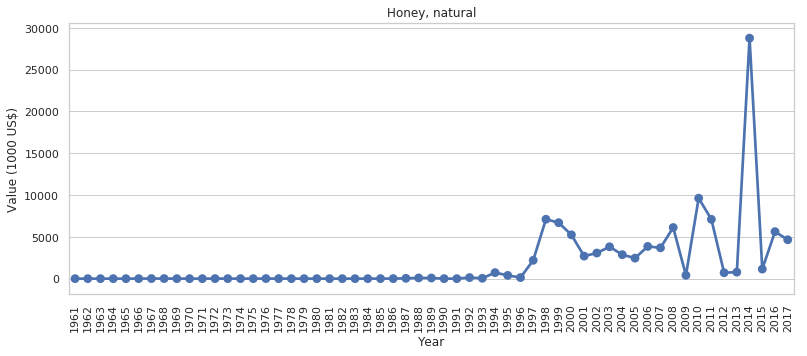

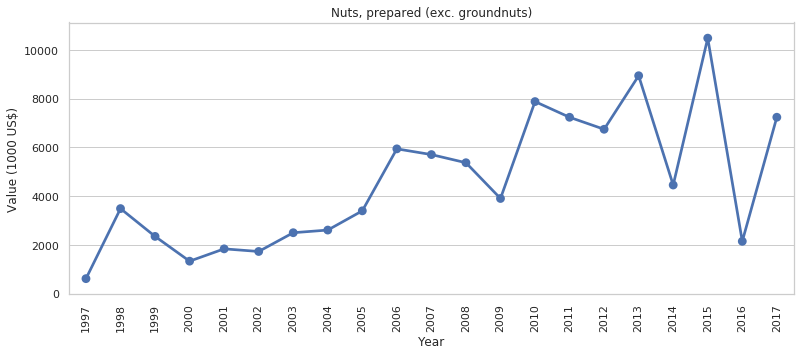

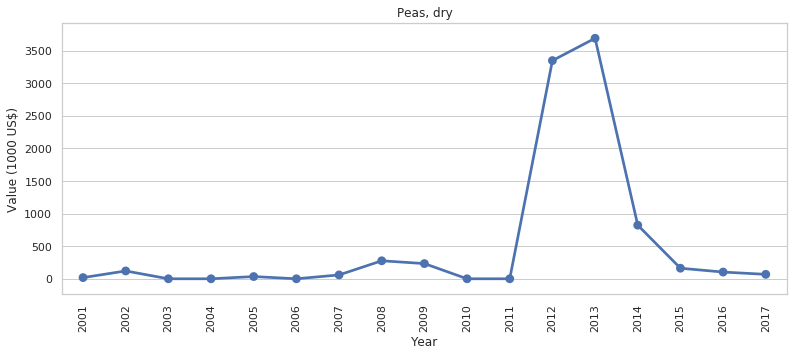

...

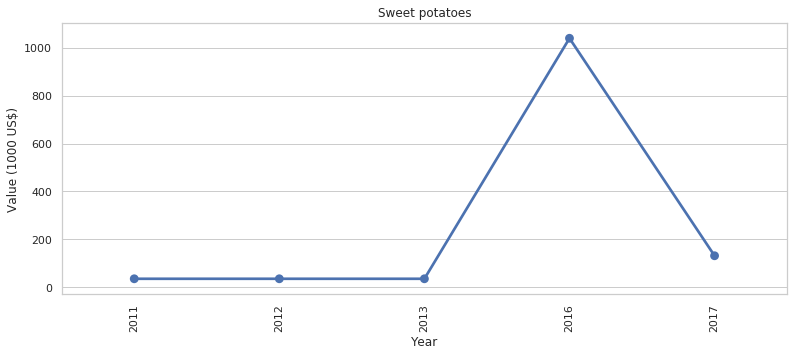

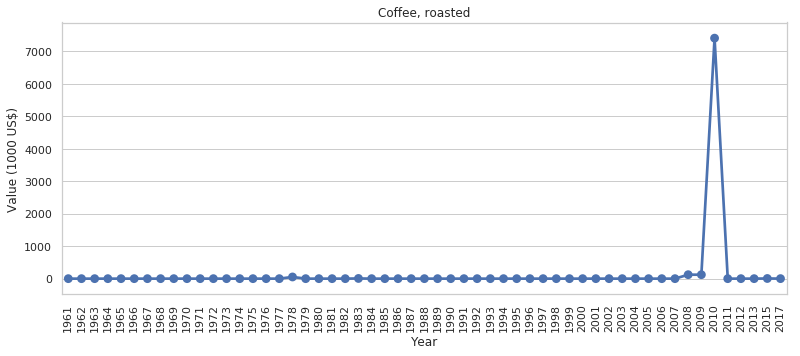

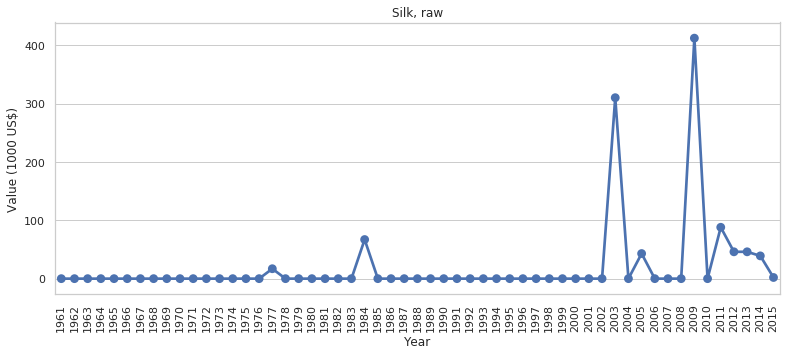

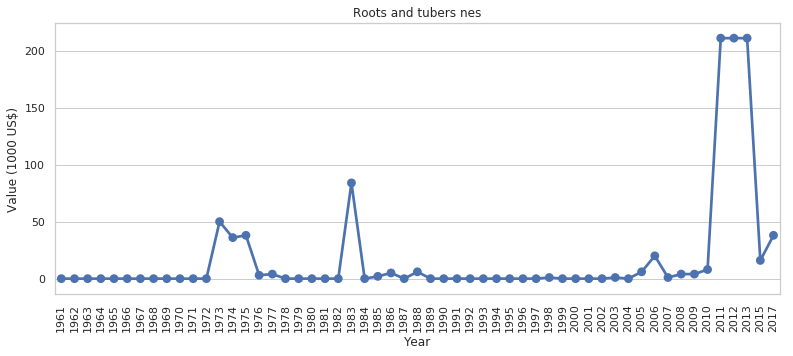

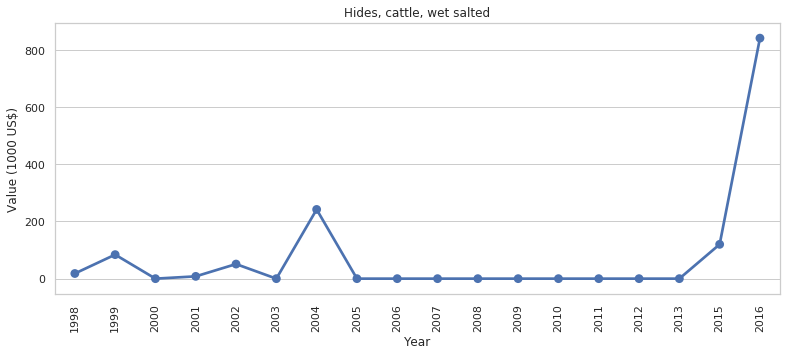

ValueError: matplotlib display text must have all code points < 128 or use Unicode strings

<Figure size 936x360 with 1 Axes>

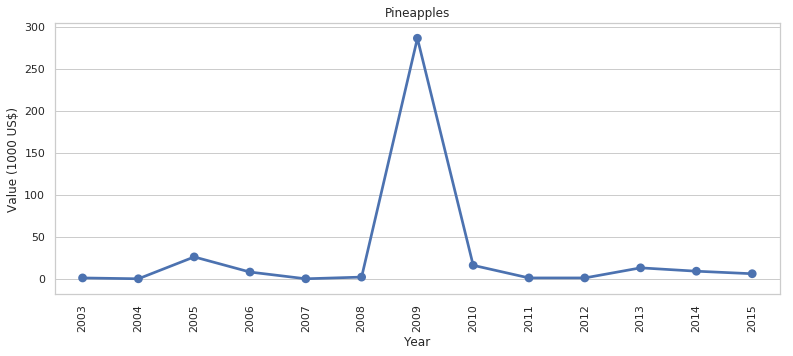

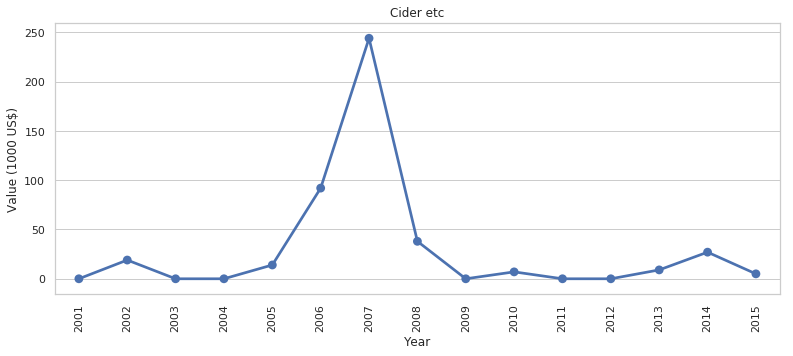

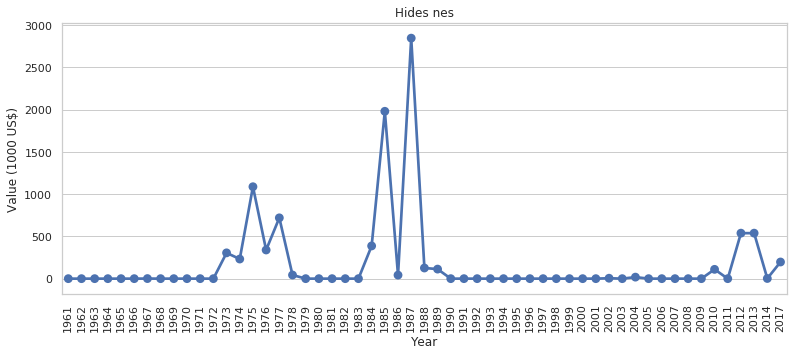

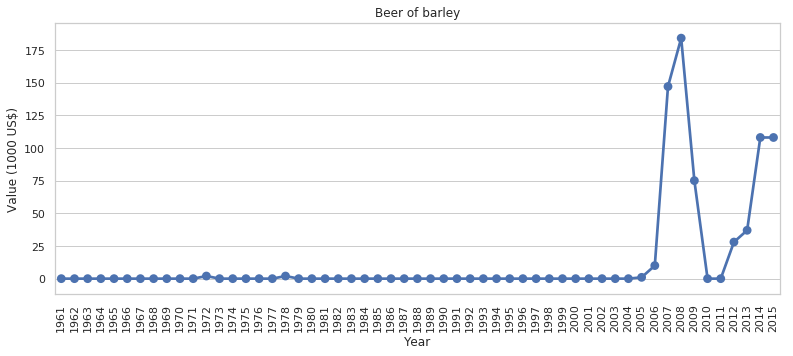

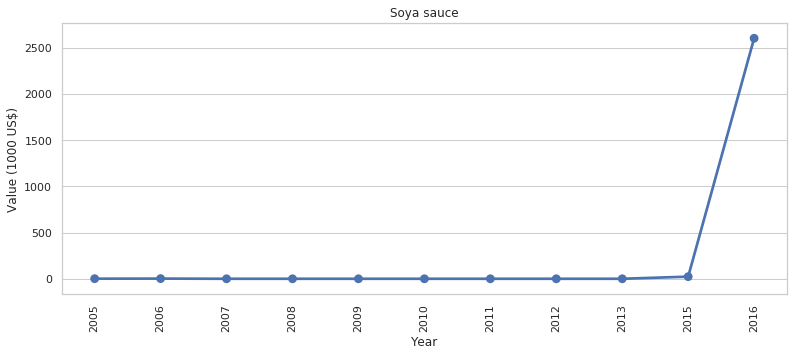

...

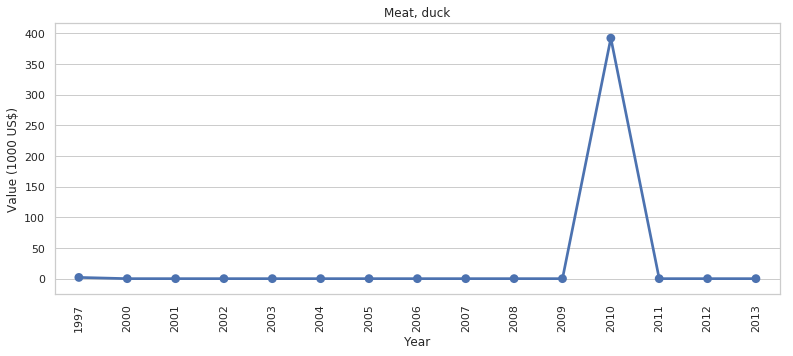

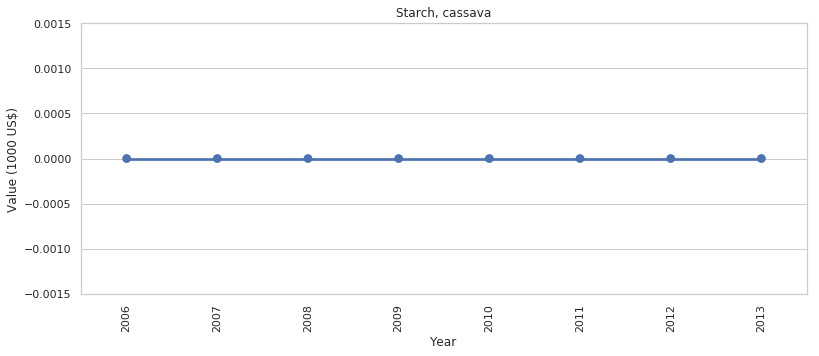

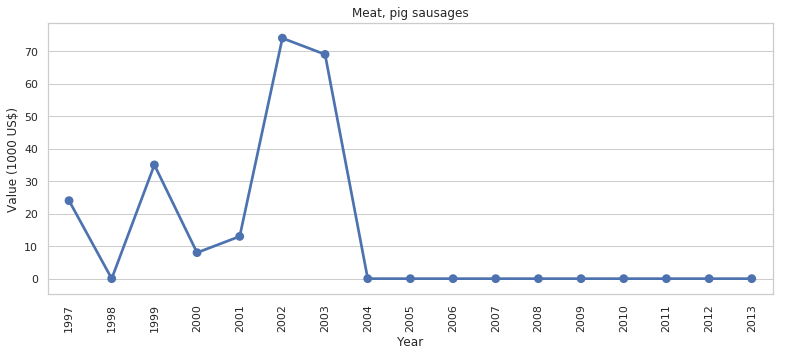

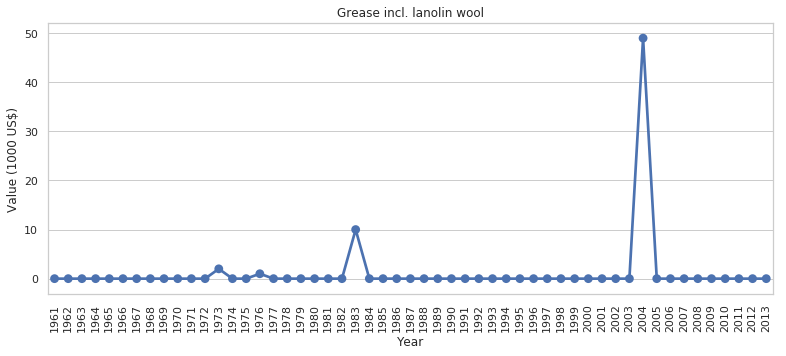

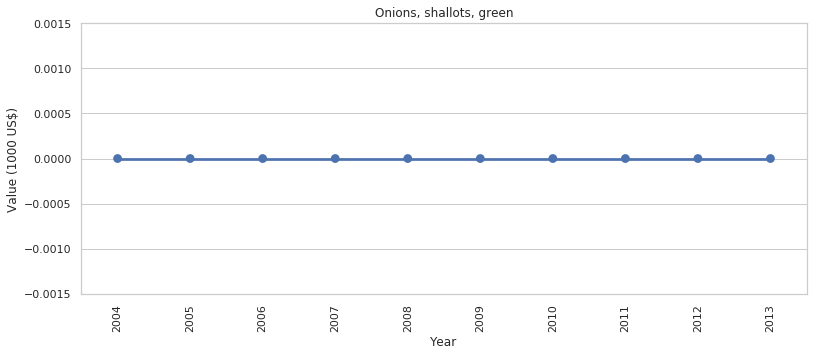

In [30]:
for item in list_of_items:
    df_temp = iran_export_value[iran_export_value['Item'] == item]
    df_temp.dropna()
    sns.set(style="whitegrid")
    plt.figure(figsize=(13, 5))
    sns.pointplot(x = 'Year' , y = 'Value' , data = df_temp)
    plt.ylabel('Value (1000 US$)')
    plt.xlabel('Year')
    plt.xticks(rotation = 90)
    plt.title(item)
    plt.show()

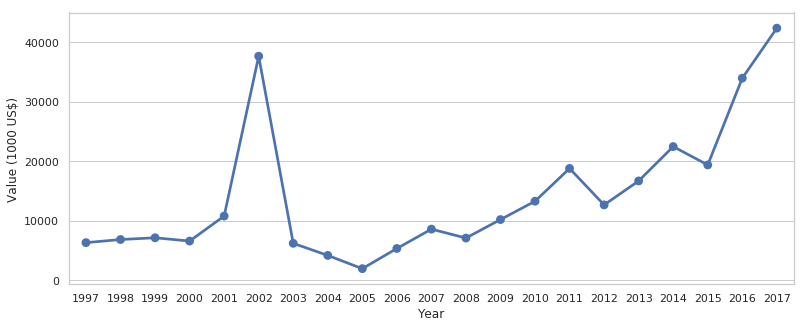

In [23]:
sns.set(style="whitegrid")
plt.figure(figsize=(13, 5))
sns.pointplot(x = 'Year' , y = 'Value' , data = almonds_shelled)
plt.ylabel('Value (1000 US$)')
plt.xlabel('Year')
plt.show()